
## Visualization

In [51]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

def plot_clusters(clusters,dataset,name):
    for index,cluster in enumerate(clusters):
        names = []
        plt.figure(figsize=(18,4))        
        plt.title(name)
        for stock in cluster:
            plt.plot(dataset[f'stock {stock+1}']);
            # names.append(labels[stock])
        plt.ylabel('Normalaized Close Price')
        plt.xlabel('day')
        # plt.legend(names)
        # if index == 15 :
        #     break
    

In [2]:
def convert_arr_to_cluster(arr):
    cls= []
    n_cluster = max(arr+1)
    for i in range(n_cluster):
        cls.append(list(np.where(arr == i)[0]))
    return cls

Load time series data :

In [3]:
My_Dataset2 = pd.read_csv('../data/processed/AE/TimeSeries.csv',index_col=0)
My_Dataset2.columns = [f'stock {i+1}' for i in range(My_Dataset2.shape[1])]

In [5]:
stock_names = np.load('../data/processed/selected_names.npy')
stock_names

array(['OMER', 'CGAU', 'BFC', ..., 'EDIT', '0267.HK', 'CPF'], dtype='<U13')

In [6]:
for col in My_Dataset2.columns:
    My_Dataset2[col] = (My_Dataset2[col] - My_Dataset2[col].mean()) / My_Dataset2[col].max()

----

In [68]:
names = np.load('../data/processed/selected_names.npy')

In [69]:
fund = pd.read_csv('../data/processed/fundemental.csv',index_col=0)

In [70]:
fund.head()

,longBusinessSummary,country,industry,sector,forwardPE,beta
OMER,"Omeros Corporation, a clinical-stage biopharma...",United States,Biotechnology,Healthcare,-1.462687,0.957814
CGAU,"Centerra Gold Inc., a gold mining company, eng...",Canada,Gold,Basic Materials,5.580645,1.039580
BFC,Bank First Corporation operates as a holding c...,United States,Banks—Regional,Financial Services,14.056655,0.340248
US.MI,UnipolSai Assicurazioni S.p.A. operates as an ...,Italy,Insurance—Diversified,Financial Services,8.307142,0.637387
001979.SZ,China Merchants Shekou Industrial Zone Holding...,China,Real Estate—Development,Real Estate,11.867925,0.335771


In [110]:
fund['country'].value_counts().get('India')

311

In [114]:
name_dict = {}
for index,name in enumerate(fund['country'].value_counts()[:].index):
    # print(fund['country'].value_counts(name))
    name_dict[name] = index

In [118]:
country_id = []
for country in fund['country']:
    country_id.append(name_dict[country])


In [ ]:
country_id = np.array(country_id)
np.save('country_id',country_id)

In [88]:
def find_country(country):
    france = list(fund[fund['country'] == country].index)
    # print(france)
    franceindex = []
    for i in france :
        index = np.where(names == i)
        franceindex.append(index[0].tolist())
        
    franceindex = np.array(franceindex).reshape(1,-1)
    
    return franceindex

/home/amir/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  if __name__ == "__main__":


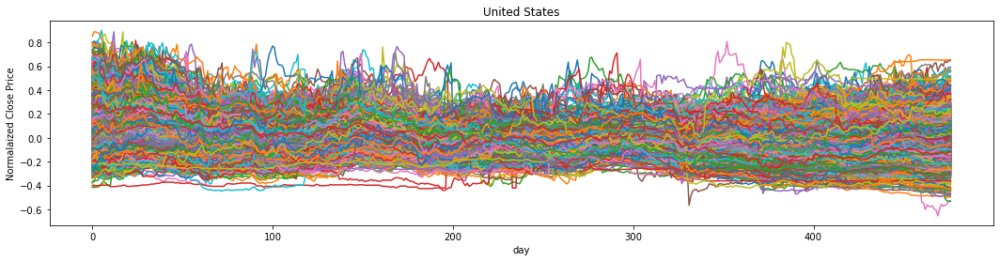

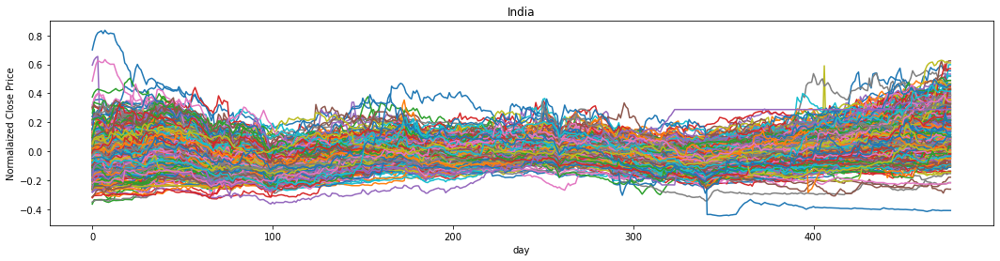

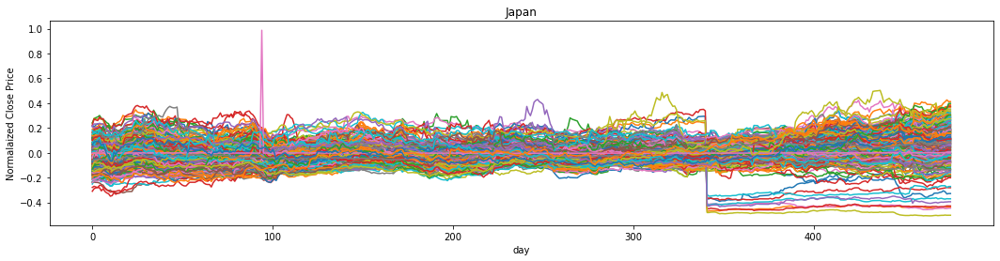

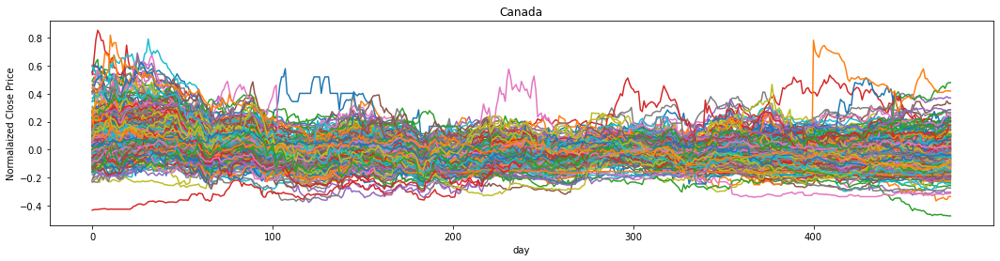

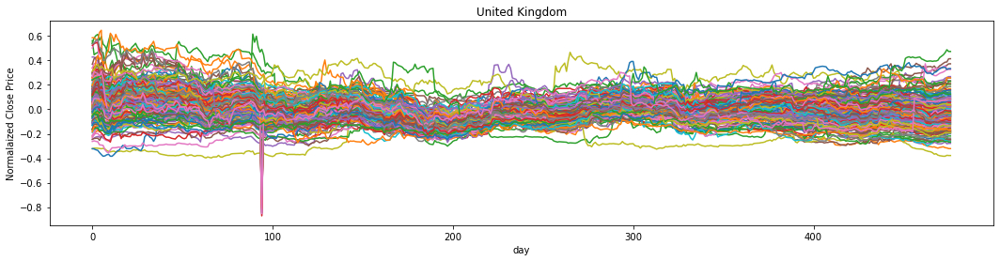

...

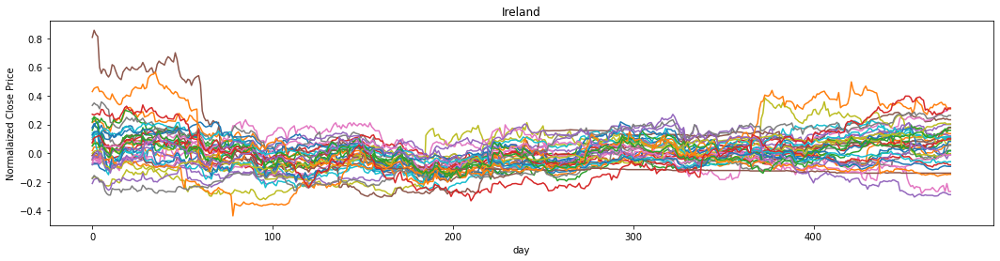

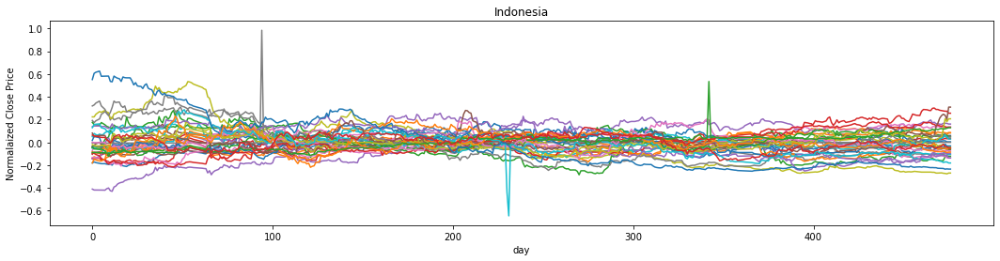

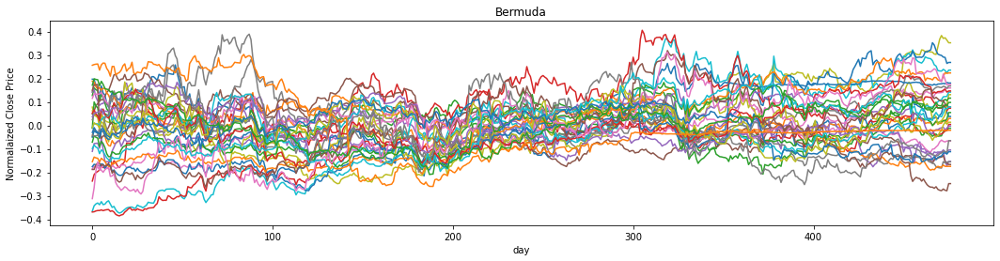

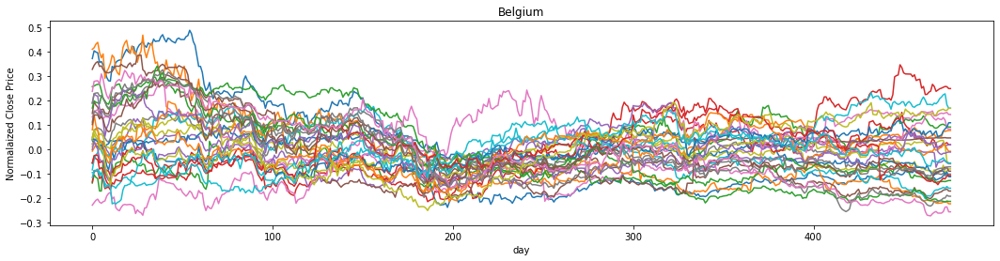

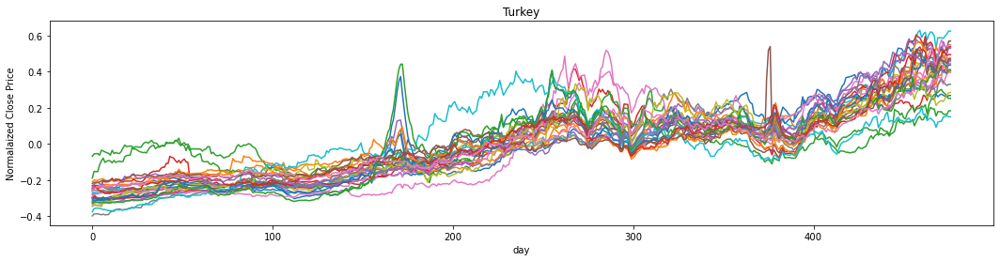

In [103]:
for name in fund['country'].value_counts()[:30].index:
    plot_clusters(find_country(name),My_Dataset2,name)

/home/amir/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  if __name__ == "__main__":


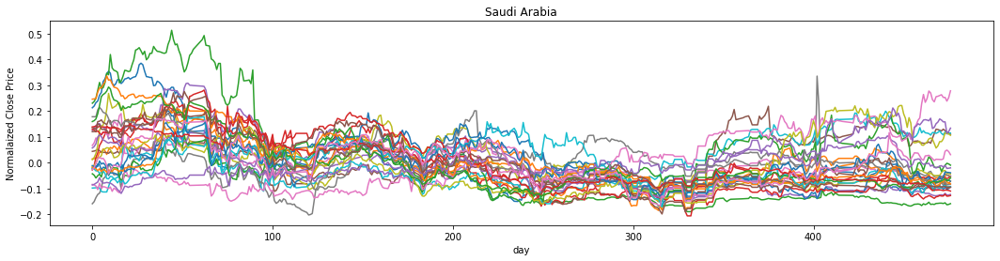

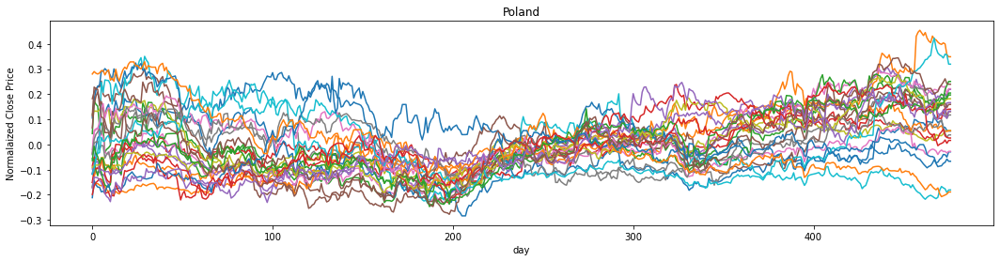

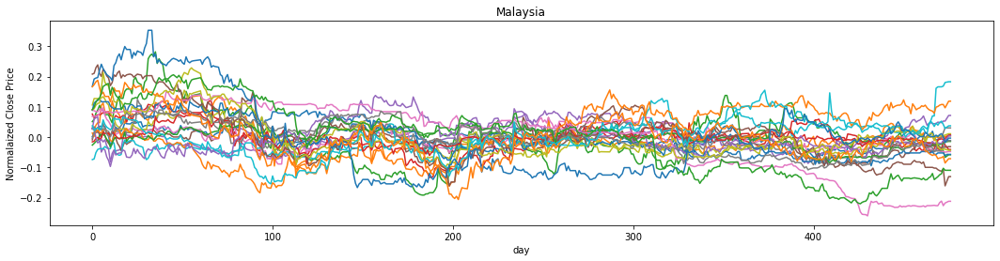

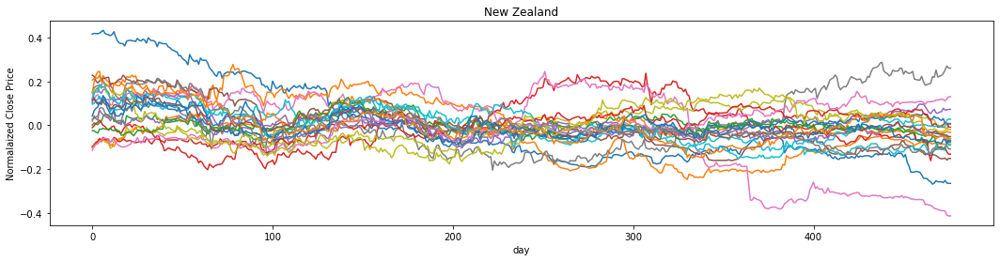

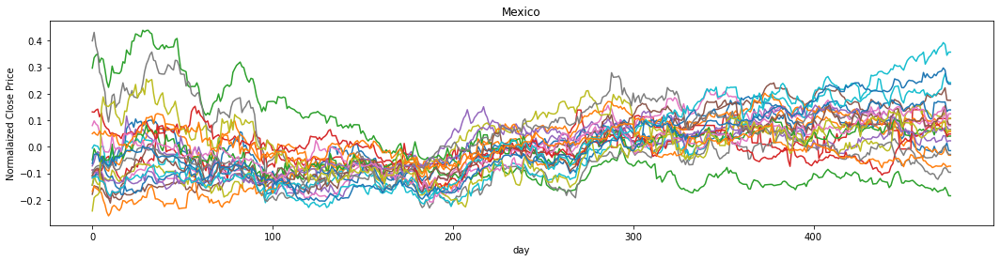

...

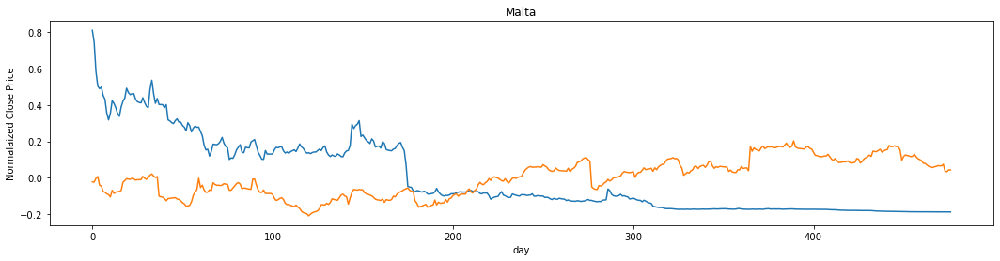

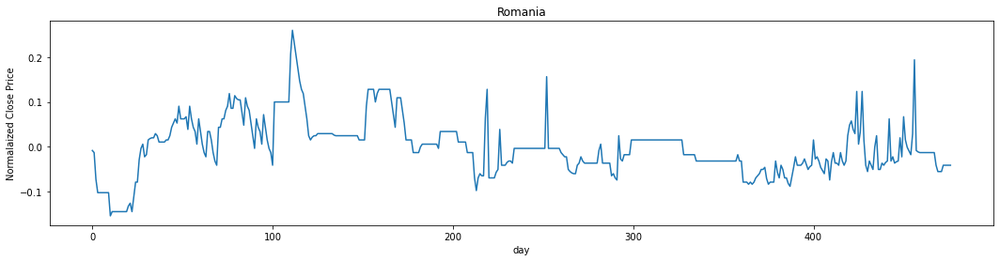

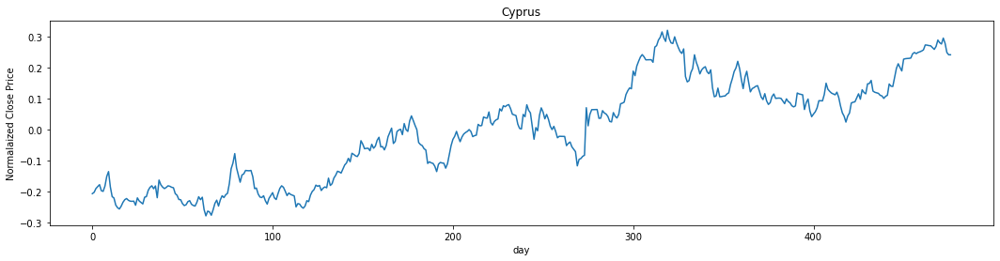

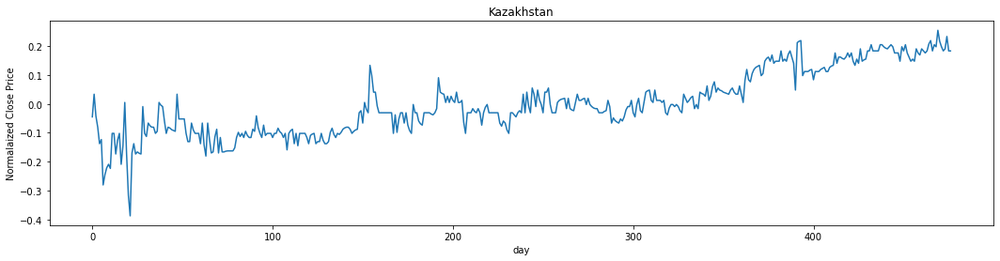

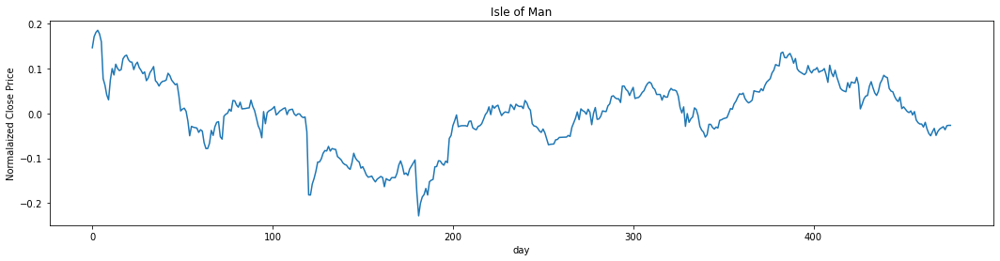

In [104]:
for name in fund['country'].value_counts()[30:60].index:
    plot_clusters(find_country(name),My_Dataset2,name)